# Plot all comparison metrics

In [1]:
import numpy as np
import pandas as pd
import pickle
import sys
import os
import dsc
from dsc.query_engine import Query_Processor as dscQP
from dsc import dsc_io

import matplotlib
import matplotlib.pyplot as plt
from pymir import mpl_stylesheet
from pymir import mpl_utils

from matplotlib import colormaps as mpl_cmaps
import matplotlib.colors as mpl_colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec

In [2]:
# import matplotlib.font_manager as mpl_fm
# font_path = '/gpfs/commons/home/sbanerjee/nygc/Futura'
# mpl_fm.fontManager.addfont(font_path + '/FuturaStd-Book.otf') # Loads "Futura Std"

# mpl_stylesheet.banskt_presentation(splinecolor = 'black', dpi = 300)
# futura_book = FontProperties(fname='/gpfs/commons/home/sbanerjee/nygc/Futura/FuturaStd-Book.otf')

manuscript_colors = {
    'brown': '#7F180D',
    'darkred': '#C10020',
    'darkyellow': '#FF6800',
    'blue': '#00538A',
    'green': '#0A8A42',
    'lightgreen': '#74B74A',    
    'yellowgreen': '#93AA00',
    'lightblue': '#A6BDD7',
    'purple': '#803E75',
    'olive': '#232C16',
    'khaki': '#CEA262',
    'darkgray': '#1A1A1A',
    'orange': '#F37239',
}

# Style sheet for manuscript
mpl_stylesheet.banskt_presentation(dpi = 300, fontsize = 22, 
    splinecolor = manuscript_colors['darkgray'], black = manuscript_colors['darkgray'])
# plt.rcParams['font.family'] = 'Futura Std'

In [3]:
dsc_output = "/gpfs/commons/groups/knowles_lab/sbanerjee/low_rank_matrix_approximation_numerical_experiments/lrma"
dsc_fname  = os.path.basename(os.path.normpath(dsc_output))
db = os.path.join(dsc_output, dsc_fname + ".db")
dscoutpkl = os.path.join("/gpfs/commons/home/sbanerjee/work/npd/lrma-dsc/dsc/results", dsc_fname + "_dscout.pkl")
dscout    = pd.read_pickle(dscoutpkl)
dscout

,DSC,simulate,simulate.n,simulate.p,simulate.k,simulate.h2,simulate.h2_shared_frac,simulate.aq,simulate.nsample_minmax,lowrankfit,...,score.MI_raw,score.adj_MI_raw,score.MI_bal,score.adj_MI_bal,score.MI_cal,score.adj_MI_cal,score.MI_bal_cal,score.adj_MI_bal_cal,score.MI_oracle_aligned,score.adj_MI_oracle_aligned
0,1,blockdiag,200.0,2000.0,10.0,0.2,0.6,0.6,"(10000,40000)",rpca,...,0.009893,0.045381,0.009893,0.045381,0.009893,0.045381,0.009893,0.045381,0.009893,0.058497
1,2,blockdiag,200.0,2000.0,10.0,0.2,0.6,0.6,"(10000,40000)",rpca,...,0.559206,0.791608,0.559206,0.791608,0.559206,0.791608,0.559206,0.791608,0.559206,0.801725
2,3,blockdiag,200.0,2000.0,10.0,0.2,0.6,0.6,"(10000,40000)",rpca,...,0.012680,0.637053,0.012680,0.637053,0.012680,0.637053,0.012680,0.637053,0.009966,0.637053
3,4,blockdiag,200.0,2000.0,10.0,0.2,0.6,0.6,"(10000,40000)",rpca,...,0.602172,0.662108,0.602172,0.662108,0.602172,0.662108,0.602172,0.662108,0.593425,0.834183
4,5,blockdiag,200.0,2000.0,10.0,0.2,0.6,0.6,"(10000,40000)",rpca,...,0.503745,0.534922,0.503745,0.534922,0.503745,0.534922,0.503745,0.534922,0.503745,0.543721
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1705,8,blockdiag_aq,200.0,2000.0,10.0,0.2,0.6,0.8,"(10000,40000)",None,...,0.006982,0.017398,1.006754,0.949173,0.006982,0.017398,1.006754,0.949173,0.981545,0.933310
1706,9,blockdiag_aq,200.0,2000.0,10.0,0.2,0.6,0.4,"(10000,40000)",None,...,0.008989,0.012553,0.010364,0.223061,0.008989,0.012553,0.010364,0.223061,0.010364,0.001357
1707,9,blockdiag_aq,200.0,2000.0,10.0,0.2,0.6,0.8,"(10000,40000)",None,...,0.010147,0.002283,1.012892,0.927433,0.010147,0.002283,1.012892,0.927433,1.012892,0.927433
1708,10,blockdiag_aq,200.0,2000.0,10.0,0.2,0.6,0.4,"(10000,40000)",None,...,0.013312,0.034239,0.008805,0.339672,0.013312,0.034239,0.008805,0.339672,0.025912,0.022569


In [4]:
dscout.columns

Index(['DSC', 'simulate', 'simulate.n', 'simulate.p', 'simulate.k',
       'simulate.h2', 'simulate.h2_shared_frac', 'simulate.aq',
       'simulate.nsample_minmax', 'lowrankfit', 'mfmethods',
       'score.global_scale', 'score.balancing_impact', 'score.L_rmse_raw',
       'score.F_rmse_raw', 'score.Z_rmse_raw', 'score.L_rmse_bal',
       'score.F_rmse_bal', 'score.Z_rmse_bal', 'score.L_rmse_cal',
       'score.F_rmse_cal', 'score.Z_rmse_cal', 'score.L_rmse', 'score.F_rmse',
       'score.Z_rmse', 'score.L_rel_rmse_raw', 'score.F_rel_rmse_raw',
       'score.Z_rel_rmse_raw', 'score.L_rel_rmse_bal', 'score.F_rel_rmse_bal',
       'score.Z_rel_rmse_bal', 'score.L_rel_rmse_cal', 'score.F_rel_rmse_cal',
       'score.Z_rel_rmse_cal', 'score.L_rel_rmse', 'score.F_rel_rmse',
       'score.Z_rel_rmse', 'score.L_psnr', 'score.F_psnr', 'score.Z_psnr',
       'score.MI_raw', 'score.adj_MI_raw', 'score.MI_bal', 'score.adj_MI_bal',
       'score.MI_cal', 'score.adj_MI_cal', 'score.MI_bal_cal',
  

In [6]:
metric_labels = {
  "global_scale_log10": "Global calibration scalar (log10 scale)",
  "balancing_impact": "Balancing impact (log10 scale)",
  "L_rmse_raw":     r"RMSE ($\hat{L}$) - align",
  "F_rmse_raw":     r"RMSE ($\hat{F}$) - align",
  "Z_rmse_raw":     r"RMSE ($\hat{L}\hat{F}^{T}$) - align",
  "L_rmse_bal":     r"RMSE ($\hat{L}$) - balance + align",
  "F_rmse_bal":     r"RMSE ($\hat{F}$) - balance + align",
  "Z_rmse_bal":     r"RMSE ($\hat{L}\hat{F}^{T}$) - balance + align",
  "L_rmse_cal":     r"RMSE ($\hat{L}$) - calibrate + align",
  "F_rmse_cal":     r"RMSE ($\hat{F}$) - calibrate + align",
  "Z_rmse_cal":     r"RMSE ($\hat{L}\hat{F}^{T}$) - calibrate + align",
  "L_rmse":         r"RMSE ($\hat{L}$) - balance + calibrate + align",
  "F_rmse":         r"RMSE ($\hat{F}$) - balance + calibrate + align",
  "Z_rmse":         r"RMSE ($\hat{L}\hat{F}^{T}$) - balance + calibrate + align",
  "L_rel_rmse_raw": r"RelErr ($\hat{L}$) - align",
  "F_rel_rmse_raw": r"RelErr ($\hat{F}$) - align",
  "Z_rel_rmse_raw": r"RelErr ($\hat{L}\hat{F}^{T}$) - align",
  "L_rel_rmse_bal": r"RelErr ($\hat{L}$) - balance + align",
  "F_rel_rmse_bal": r"RelErr ($\hat{F}$) - balance + align",
  "Z_rel_rmse_bal": r"RelErr ($\hat{L}\hat{F}^{T}$) - balance + align",
  "L_rel_rmse_cal": r"RelErr ($\hat{L}$) - calibrate + align",
  "F_rel_rmse_cal": r"RelErr ($\hat{F}$) - calibrate + align",
  "Z_rel_rmse_cal": r"RelErr ($\hat{L}\hat{F}^{T}$) - calibrate + align",
  "L_rel_rmse":     r"RelErr ($\hat{L}$) - balance + calibrate + align",
  "F_rel_rmse":     r"RelErr ($\hat{F}$) - balance + calibrate + align",
  "Z_rel_rmse":     r"RelErr ($\hat{L}\hat{F}^{T}$) - balance + calibrate + align",
  "MI_raw":                "MI - native",
  "adj_MI_raw":            "Adj. MI - native",
  "MI_bal":                "MI - balance",
  "adj_MI_bal":            "Adj. MI - balance",
  "MI_cal":                "MI - calibrate",
  "adj_MI_cal":            "Adj. MI - calibrate",
  "MI_bal_cal":                "MI - balance + calibrate",
  "adj_MI_bal_cal":            "Adj. MI - balance + calibrate",
  "MI_oracle_aligned":     "MI - balance + calibrate + align",
  "adj_MI_oracle_aligned": "Adj. MI - balance + calibrate + align",
}

In [7]:
dscout["mfmethods"].unique()

array(['truncated_svd', 'flashier', 'flashier_sparse', 'guide', 'gleanr',
       'factorgo'], dtype=object)

In [91]:
methods = {
    "rpca" : ["rpca", "truncated_svd"],
    "nnm"  : ["nnm", "truncated_svd"],
    "nnm_sparse" : ["nnm_sparse", "truncated_svd"],
    "truncated_svd" : [None, "truncated_svd"],
    "factorgo" : [None, "factorgo"],
    "flashier" : [None, "flashier"],
    "flashier_sparse" : [None, "flashier_sparse"],
    "guide" : [None, "guide"],
    "gleanr" : [None, "gleanr"],
}

method_labels = {
    "rpca" : "Clorinn (RPCA)",
    "nnm" : "Clorinn (NNM)",
    "nnm_sparse" : "Clorinn (NNM-Sparse)",
    "truncated_svd": "Truncated SVD",
    "factorgo": "FactorGO",
    "flashier" : "Flashier (Default)",
    "flashier_sparse" : "Flashier (Sparse)",
    "guide" : "GUIDE",
    "gleanr" : "GLEANR",
}

method_colors = {
    "rpca" : manuscript_colors['brown'],
    "nnm" : manuscript_colors['darkred'],
    "nnm_sparse" : manuscript_colors['darkyellow'],
    "truncated_svd" : manuscript_colors['blue'],
    "factorgo" : manuscript_colors['lightblue'],
    "flashier" : manuscript_colors['green'],
    "flashier_sparse" : manuscript_colors['yellowgreen'],
    "guide" : manuscript_colors['purple'],
    "gleanr" : manuscript_colors['khaki'],
}

def stratify_dfcol(df, colname, value):
    #return pd_utils.select_dfrows(df, [f"$({colname}) == {value}"])
    if value is None:
        return df.loc[df[colname].isnull()]
    else:
        return df.loc[df[colname] == value]

def stratify_dfcols(df, condition_list):
    for (colname, value) in condition_list:
        df = stratify_dfcol(df, colname, value)
    return df

def stratify_dfcols_in_list(df, colname, values):
    return df.loc[df[colname].isin(values)]

def get_simulation_with_variable(df, var_name, var_values):
    condition = [(f'simulate.{k}', v) for k, v in simparams.items() if k != var_name]
    df1 = stratify_dfcols(df, condition)
    df2 = stratify_dfcols_in_list(df1, f'simulate.{var_name}', var_values)
    return df2

def get_scores_from_dataframe(df, score_name, variable_name, variable_values, methods = methods):
    simdf = get_simulation_with_variable(df, variable_name, variable_values)
    scores = {key: list() for key in methods.keys()}
    for method, mlist in methods.items():
        mrows = stratify_dfcols(simdf, [('lowrankfit', mlist[0]), ('mfmethods', mlist[1])])
        for value in variable_values:
            vrows = stratify_dfcol(mrows, f'simulate.{variable_name}', value)
            scores[method].append(vrows[f'score.{score_name}'].to_numpy())
    return scores

def get_scores_all_simulations(df, score_name, methods = methods):
    # simdf = get_simulation_with_variable(df, variable_name, variable_values)
    scores = {key: list() for key in methods.keys()}
    for method, mlist in methods.items():
        mrows = stratify_dfcols(df, [('lowrankfit', mlist[0]), ('mfmethods', mlist[1])])
        scores[method].append(mrows[f'score.{score_name}'].to_numpy())
    return scores

def random_jitter(xvals, yvals, d = 0.1):
    """
    yvals: ndarray (ndim=1) or list
    xvals: ndarray (ndim=1) or list or int
        same shape as yvals, recast to the shape of yvals if int
    """
    yvals = np.asarray(yvals)
    if isinstance(xvals, (int, np.integer)):
        xvals = np.full(yvals.shape, xvals, dtype=float)
    else:
        xvals = np.asarray(xvals, dtype=float)
    xjitter = xvals + np.random.randn(*yvals.shape) * d
    # xjitter = [x + np.random.randn(len(y)) * d for x, y in zip(xvals, yvals)]
    return xjitter

def remove_iqr_outliers(arr, k=1.5, label="score", debug = False):
    """
    Remove outliers using Tukey's IQR rule:
        keep values within [Q1 - k*IQR, Q3 + k*IQR]
    """
    arr = np.asarray(arr, dtype=float)

    finite = np.isfinite(arr)
    arr_finite = arr[finite]

    q1 = np.percentile(arr_finite, 25)
    q3 = np.percentile(arr_finite, 75)
    iqr = q3 - q1

    lower = q1 - k * iqr
    upper = q3 + k * iqr

    keep = finite & (arr >= lower) & (arr <= upper)
    bad = ~keep

    if bad.any() and debug:
        print(f"\n[{label}] removed {bad.sum()} / {arr.size} values")
        print(f"  Q1={q1:.6g}, Q3={q3:.6g}, IQR={iqr:.6g}")
        print(f"  allowed range: [{lower:.6g}, {upper:.6g}]")
        print("  bad indices:", np.argwhere(bad).ravel()[:20])
        print("  bad values:", arr[bad][:20])

    return arr[keep]

# def should_use_broken_axis(arrays_by_method, gap_factor=10.0):
#     use_broken_axis = False
#     vals = {k: np.nanmean(v) for k, v in arrays_by_method.items()}
#     arr = np.asarray(list(vals.values()))
#     midval = np.nanpercentile(arr, 50)
#     allowed_lo = np.nanpercentile(arr, 30)
#     allowed_hi = np.nanpercentile(arr, 70)
#     allowed_range = gap_factor * (allowed_hi - allowed_lo)
#     pathological = list()
#     for mkey, mean in vals.items():
#         if abs(mean - midval) > allowed_range:
#             use_broken_axis = True
#             pathological.append(mkey)
#     return use_broken_axis, pathological

def should_use_broken_axis(arrays_by_method, gap_factor=100.0):
    use_broken_axis = False
    pathological = list()
    vals = {k: np.nanmedian(v) for k, v in arrays_by_method.items()}
    x = np.asarray(list(vals.values()))
    center = np.nanmedian(x)
    mad = np.median(np.abs(x - center))
    scale = 1.4826 * mad
    robust_x = np.abs(x - center) / scale
    mask = robust_x > gap_factor
    if np.any(mask):
        use_broken_axis = True
        pathological = [m for i, m in enumerate(list(vals.keys())) if mask[i]]
    return use_broken_axis, pathological

In [92]:
plot_metrics = [
    ["global_scale_log10", "balancing_impact"],
    # ["L_rmse_bal", "F_rmse_bal", "Z_rmse_bal"],
    # ["L_rmse", "F_rmse", "Z_rmse"],
    ["adj_MI_raw", "L_rel_rmse_raw", "F_rel_rmse_raw", "Z_rel_rmse_raw"],
    ["adj_MI_bal", "L_rel_rmse_bal", "F_rel_rmse_bal", "Z_rel_rmse_bal"],
    ["adj_MI_cal", "L_rel_rmse_cal", "F_rel_rmse_cal", "Z_rel_rmse_cal"],
    ["adj_MI_bal_cal", "L_rel_rmse", "F_rel_rmse", "Z_rel_rmse"],
    ["MI_raw", "MI_bal", "MI_cal", "MI_oracle_aligned"],
    # ["adj_MI_raw", "adj_MI_bal", "adj_MI_cal", "adj_MI_bal_cal"],
]

drop_mask = (
    (dscout["simulate.h2"] == 0.2) &
    (dscout["simulate.n"] == 200) &
    (dscout["simulate.p"] == 2000)
)
dscout_plot = dscout.loc[~drop_mask].copy()
dscout_plot["score.global_scale_log10"] = np.log10(
    dscout_plot["score.global_scale"].where(dscout_plot["score.global_scale"] > 0)
)

nmethods = len(methods)
ncols = max([len(x) for x in plot_metrics])
nrows = len(plot_metrics)
fig_width_per_col = 9
fig_height_per_row = 8
fig = plt.figure(figsize=(fig_width_per_col * ncols, fig_height_per_row * nrows))

gs   = fig.add_gridspec(nrows, ncols)
boxs = {x: None for x in methods.keys()}

def clean_score_array(x):
    x = np.asarray(x).ravel()
    return x[np.isfinite(x)]

def draw_box_scatter(ax, arrays_by_method, boxs):
    for j, mkey in enumerate(methods.keys()):
        boxcolor = method_colors[mkey]
        boxface = f'#{boxcolor[1:]}80'
        medianprops = dict(linewidth=0, color = boxcolor)
        whiskerprops = dict(linewidth=2, color = boxcolor)
        boxprops = dict(linewidth=2, color = boxcolor, facecolor = boxface)
        flierprops = dict(marker='o', markerfacecolor=boxface, markersize=3, markeredgecolor = boxcolor)

        m_score_arr = clean_score_array(arrays_by_method[mkey])
        xpos = [j]
        boxs[mkey] = ax.boxplot(m_score_arr, positions = xpos,
            showcaps = False, showfliers = False,
            widths = 0.7, patch_artist = True, notch = False,
            flierprops = flierprops, boxprops = boxprops,
            medianprops = medianprops, whiskerprops = whiskerprops)
        ax.scatter(random_jitter(j, m_score_arr), m_score_arr, 
               edgecolor = boxcolor, facecolor = boxface, linewidths = 1, 
               s = 10)
    return

def style_metric_axis(ax):
    ax.tick_params(bottom = False, top = False, left = False, right = False,
                   labelbottom = False, labeltop = False, labelleft = False, labelright = False)

def padded_ylim(x, pad_frac=0.08):
    x = clean_score_array(x)
    ymin = np.nanmin(x)
    ymax = np.nanmax(x)
    pad = pad_frac * (ymax - ymin)
    return ymin - pad, ymax + pad

def sanitize_scores_manually(array_by_method, metric_name):
    if metric_name in ("L_rmse_raw", "L_rel_rmse_raw", "L_rmse_cal", "L_rel_rmse_cal"):
        gleanr_vals = array_by_method["gleanr"][0]
        array_by_method["gleanr"] = [np.sort(gleanr)[::-1][3:]]
    return array_by_method


for r, row_metrics in enumerate(plot_metrics):
    for c, metric_name in enumerate(row_metrics):
        ax = fig.add_subplot(gs[r, c])
        scores = get_scores_all_simulations(dscout_plot, metric_name)        
        scores_by_method = {mkey: scores[mkey] for mkey in methods.keys()}
        scores_by_method = sanitize_scores_manually(scores_by_method, metric_name)
        score_label = metric_labels[metric_name]
        
        use_broken_axis, pathological_methods = should_use_broken_axis(scores_by_method)
        #print (f"{metric_name}: {use_broken_axis}")
        
        if use_broken_axis:
            subgs = gs[r, c].subgridspec(2, 1, height_ratios=[1, 3], hspace=0.05)
            ax_top = fig.add_subplot(subgs[0])
            ax_bottom = fig.add_subplot(subgs[1], sharex=ax_top)
            
            draw_box_scatter(ax_top,    scores_by_method, boxs)
            draw_box_scatter(ax_bottom, scores_by_method, boxs)
            
            normal_values = np.concatenate([
                arr[0] for mkey, arr in scores_by_method.items()
                if mkey not in pathological_methods
            ])

            pathological_values = np.concatenate([
                arr[0] for mkey, arr in scores_by_method.items()
                if mkey in pathological_methods
            ])
            
            ax_top.set_ylim(*padded_ylim(pathological_values))           
            ax_bottom.set_ylim(*padded_ylim(normal_values))
            
            for side in ["left", "right", "top", "bottom"]:
                ax.spines[side].set_visible(False)
            style_metric_axis(ax)

            style_metric_axis(ax_top)
            style_metric_axis(ax_bottom)
            ax_top.tick_params(left = True, labelleft = True)
            ax_bottom.tick_params(left = True, labelleft = True)
 
            ax_top.set_title(score_label, pad=20)
            
        else:
            draw_box_scatter(ax, scores_by_method, boxs)
            style_metric_axis(ax)
            ax.tick_params(left = True, labelleft = True)
            ax.set_title(score_label, pad = 20)


handles = [boxs[mkey]["boxes"][0] for mkey in methods.keys()]
labels = [method_labels[mkey] for mkey in methods.keys()]

axleg = fig.add_subplot(gs[0, 2:])
axleg.legend(handles = handles, labels = labels, 
          loc = 'upper left', frameon = False, handlelength = 2, ncol = 2)
for side in ["left", "right", "top", "bottom"]:
    axleg.spines[side].set_visible(False)
style_metric_axis(axleg)

plt.tight_layout()
plt.savefig('sim_postprocessing_comparison.png', bbox_inches='tight')
plt.show()

In [90]:
def should_use_broken_axis(arrays_by_method, gap_factor=50.0):
    use_broken_axis = False
    pathological = list()
    vals = {k: np.nanmedian(v) for k, v in arrays_by_method.items()}
    x = np.asarray(list(vals.values()))
    center = np.nanmedian(x)
    mad = np.median(np.abs(x - center))
    scale = 1.4826 * mad
    robust_x = np.abs(x - center) / scale
    print (f"Means: {x}")
    print (f"Median: {center}")
    print (f"MAD: {mad}")
    print (f"Scale: {scale}")
    print (f"Robust means: {robust_x}")
    mask = robust_x > gap_factor
    print (f"Pathological groups: {mask}")
    print (f"Robust means of pathological groups: {robust_x[mask]}")
    if np.any(mask):
        use_broken_axis = True
        pathological = [m for i, m in enumerate(list(vals.keys())) if mask[i]]
    return use_broken_axis, pathological

scores = get_scores_all_simulations(dscout_plot, "MI_raw")        
scores_by_method = {mkey: scores[mkey] for mkey in methods.keys()}
scores_by_method = sanitize_scores_manually(scores_by_method, "MI_raw")
should_use_broken_axis(scores_by_method)

Means: [0.52410324 0.43828051 0.45304963 0.02150866 0.01241604 0.01509776
 0.01413376 0.01258976 0.01769236]
Median: 0.01769235527106345
MAD: 0.005102591685628911
Scale: 0.007565102433113423
Robust means: [66.94038663 55.59583042 57.54810036  0.50446218  0.6974547   0.34296836
  0.47039632  0.67449076  0.        ]
Pathological groups: [ True  True  True False False False False False False]
Robust means of pathological groups: [66.94038663 55.59583042 57.54810036]


(True, ['rpca', 'nnm', 'nnm_sparse'])

In [87]:
stratify_dfcols(dscout, [('lowrankfit', None), ('mfmethods', 'gleanr'), ('simulate.p', 10000)])

,DSC,simulate,simulate.n,simulate.p,simulate.k,simulate.h2,simulate.h2_shared_frac,simulate.aq,simulate.nsample_minmax,lowrankfit,...,score.MI_raw,score.adj_MI_raw,score.MI_bal,score.adj_MI_bal,score.MI_cal,score.adj_MI_cal,score.MI_bal_cal,score.adj_MI_bal_cal,score.MI_oracle_aligned,score.adj_MI_oracle_aligned
753,1,blockdiag_p,200.0,10000.0,10.0,0.2,0.6,0.6,"(10000,40000)",None,...,0.034524,0.517039,0.838146,0.859394,0.034524,0.517039,0.838146,0.859394,0.838146,0.859394
757,2,blockdiag_p,200.0,10000.0,10.0,0.2,0.6,0.6,"(10000,40000)",None,...,0.581565,0.572070,0.620035,0.505318,0.581565,0.572070,0.620035,0.505318,0.608558,0.545021
761,3,blockdiag_p,200.0,10000.0,10.0,0.2,0.6,0.6,"(10000,40000)",None,...,0.028581,0.564874,0.641933,0.699249,0.028581,0.564874,0.641933,0.699249,0.641933,0.680010
765,4,blockdiag_p,200.0,10000.0,10.0,0.2,0.6,0.6,"(10000,40000)",None,...,0.609358,0.658004,0.619114,0.655805,0.609358,0.658004,0.619114,0.655805,0.613723,0.700888
769,5,blockdiag_p,200.0,10000.0,10.0,0.2,0.6,0.6,"(10000,40000)",None,...,0.933259,0.893500,0.933259,0.832527,0.933259,0.893500,0.933259,0.832527,0.933259,0.840463
773,6,blockdiag_p,200.0,10000.0,10.0,0.2,0.6,0.6,"(10000,40000)",None,...,0.196728,0.600022,0.263844,0.743599,0.196728,0.600022,0.263844,0.743599,0.776581,0.727379
777,7,blockdiag_p,200.0,10000.0,10.0,0.2,0.6,0.6,"(10000,40000)",None,...,0.010307,-0.002070,0.010307,-0.002070,0.010307,-0.002070,0.010307,-0.002070,0.010307,-0.002070
781,8,blockdiag_p,200.0,10000.0,10.0,0.2,0.6,0.6,"(10000,40000)",None,...,0.008745,-0.006706,0.008745,-0.006706,0.008745,-0.006706,0.008745,-0.006706,0.008745,-0.006706
785,9,blockdiag_p,200.0,10000.0,10.0,0.2,0.6,0.6,"(10000,40000)",None,...,0.996607,0.860677,0.996607,0.860677,0.996607,0.860677,0.996607,0.860677,0.986732,0.840599
789,10,blockdiag_p,200.0,10000.0,10.0,0.2,0.6,0.6,"(10000,40000)",None,...,0.372329,0.676066,0.625848,0.661741,0.372329,0.676066,0.625848,0.661741,0.017875,0.681404


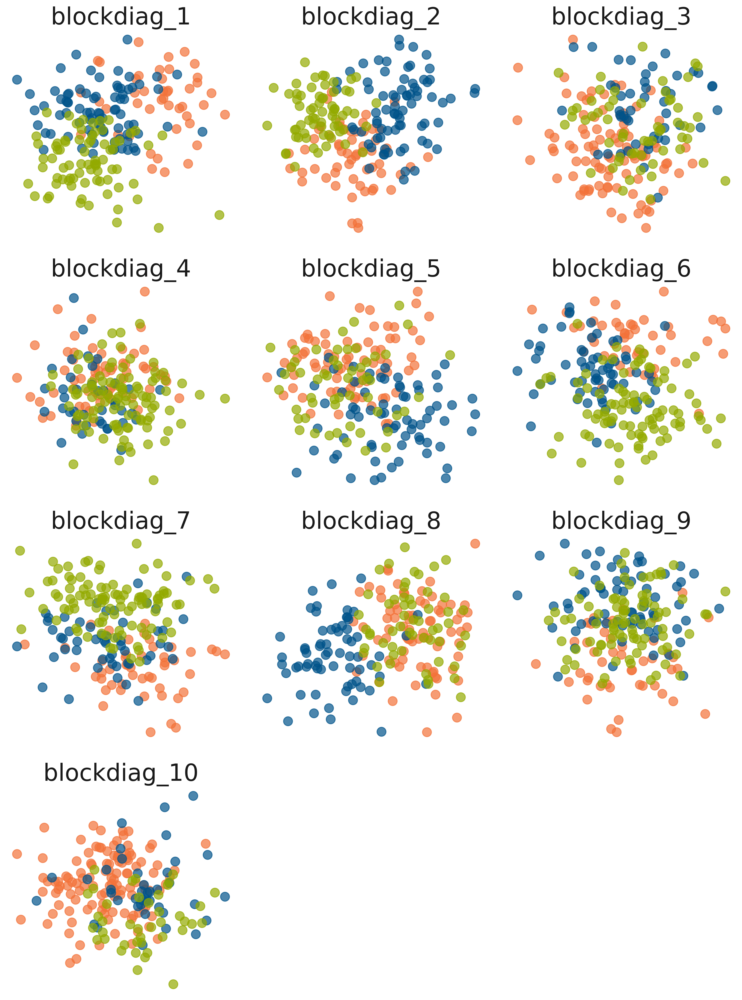

In [13]:
nsim = 10
nrow = 4
ncol = 3

fig = plt.figure(figsize = (12,16))
axs = [fig.add_subplot(nrow, ncol, i+1) for i in range(nsim)]

for i in range(nsim):
    _filename = os.path.join(dsc_output, f"blockdiag/blockdiag_{i+1}.pkl")
    with open(_filename, "rb") as fh:
        _simdata = pickle.load(fh)

    make_plot_pca(axs[i], _simdata['Ltrue'], _simdata['Ctrue'], 
                  list(set(simdata['Ctrue'])), colorlist)
    axs[i].set_title(f"blockdiag_{i+1}")
    
plt.tight_layout()
plt.show()